<a href="https://colab.research.google.com/github/ibnuzzi/PCVK_Ganjil_26/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Transformasi Linier Brightness**

Formula: $g(x,y)=f(x,y)+b$$g(x,y)$ adalah nilai pixel setelah transformasi, $f(x,y)$ adalah nilai pixel asli, $b$ adalah nilai brightness

 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 30


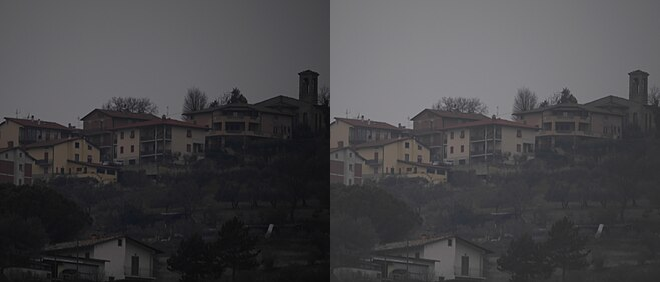

In [16]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/houses.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

1. Hasil Inverse Citra:


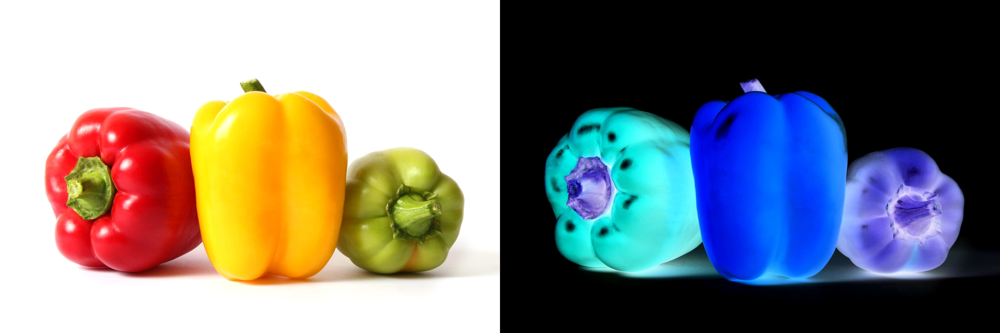

In [11]:
#Tugas 1 Implementasi Inverse Citra

# Sesuaikan path dengan lokasi gambar 'peppers.jpg' di Google Drive Anda
img_peppers = cv.imread('/content/drive/MyDrive/PCVK/peppers.jpeg')

# Operasi Inverse: g(x) = 255 - f(x)
# Mengurangkan nilai 255 dengan nilai pixel asli
inverse_image = 255 - img_peppers

# Menggabungkan gambar asli dan gambar inverse secara horizontal (bersebelahan)
final_frame_inverse = cv.hconcat((img_peppers, inverse_image))

print("1. Hasil Inverse Citra:")
cv2_imshow(final_frame_inverse)

 Mengubah kontras dan tingkat kecerahan citra 
----------------------------------------------
Masukkan tingkat kecerahan : 10
Masukkan kontras : 1.5

2. Hasil Transformasi Contrast:


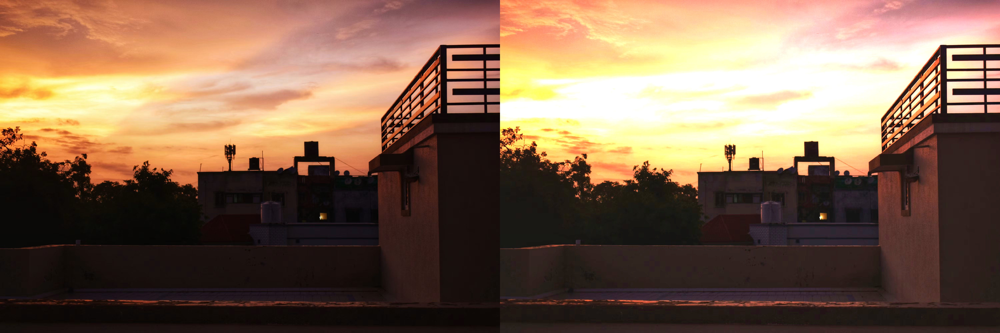

In [19]:
#Tugas 2. Implementasi Transformasi Contrast

print(' Mengubah kontras dan tingkat kecerahan citra ')
print('----------------------------------------------')
try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast = float(input('Masukkan kontras : '))
except ValueError:
    print('Error, input tidak valid')

# Sesuaikan path dengan lokasi gambar Anda
img_sunset = cv.imread('/content/drive/MyDrive/PCVK/sunset.jpg')

# Menggunakan fungsi bawaan OpenCV yang terhindar dari isu tipe data / overflow
# alpha = a (nilai kontras), beta = b (nilai brightness)
contrast_image = cv.convertScaleAbs(img_sunset, alpha=contrast, beta=brightness)

# Menggabungkan gambar asli dan gambar hasil kontras secara horizontal
final_frame_contrast = cv.hconcat((img_sunset, contrast_image))

print("\n2. Hasil Transformasi Contrast:")
cv2_imshow(final_frame_contrast)

 Mengubah tingkat kecerahan citra dengan Transformasi Log 
----------------------------------------------------------
Masukkan nilai kecerahan: 50


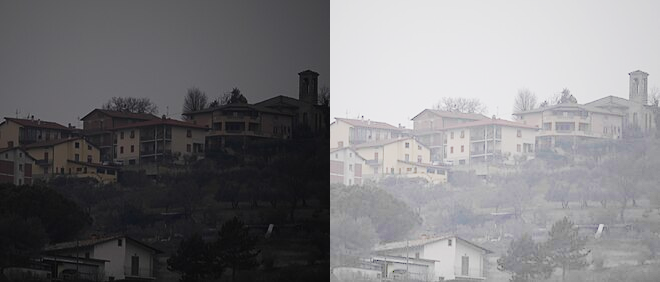

In [18]:
#Tugas 3. Implementasi Transformasi Logarithmic Brightness

print(' Mengubah tingkat kecerahan citra dengan Transformasi Log ')
print('----------------------------------------------------------')
try:
    # Nilai ini akan bertindak sebagai konstanta 'c'
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

# Sesuaikan path dengan lokasi gambar Anda
img_houses = cv.imread('/content/drive/MyDrive/PCVK/houses.jpg')

# 1. Konversi citra ke tipe data float64 agar perhitungan logaritma akurat
img_float = img_houses.astype(np.float64)

# 2. Terapkan rumus s = c * log(1 + r) menggunakan input brightness sebagai c
log_image = brightness * np.log(1 + img_float)

# 3. Batasi nilai piksel agar tidak lebih dari 255, lalu kembalikan ke uint8
log_image = np.clip(log_image, 0, 255).astype(np.uint8)

# 4. Gabungkan dan tampilkan gambar
final_frame_log = cv.hconcat((img_houses, log_image))
cv2_imshow(final_frame_log)

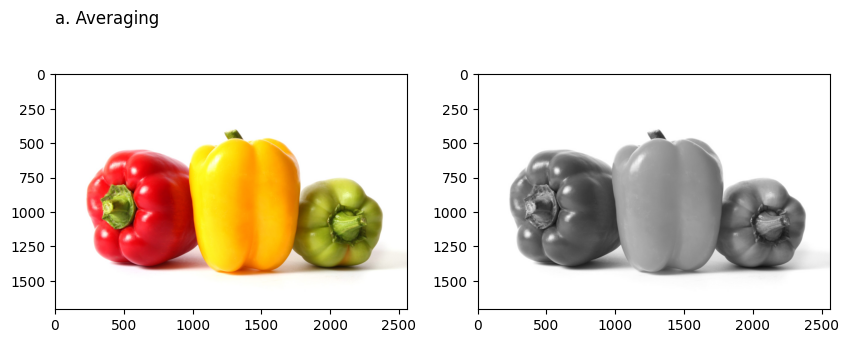

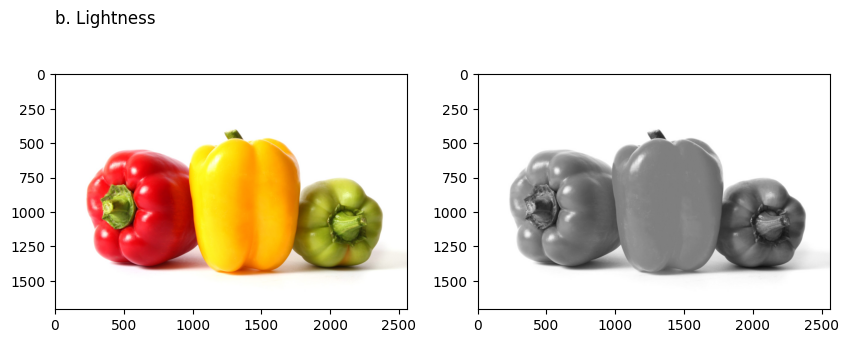

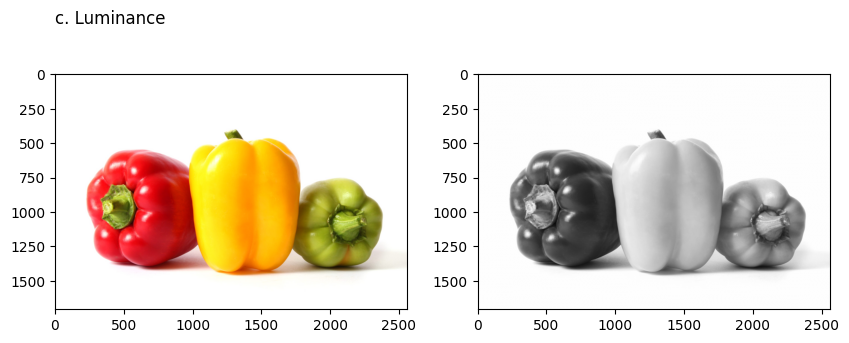

In [27]:
#Tugas 4. Implementasi Transformasi Grayscale

import matplotlib.pyplot as plt

# Sesuaikan path dengan lokasi gambar Anda
img_peppers = cv.imread('/content/drive/MyDrive/PCVK/peppers.jpeg')

# Pisahkan channel warna dan konversi ke float untuk menghindari overflow saat perhitungan
B, G, R = cv.split(img_peppers.astype(float))

# a. Averaging
gray_avg = (R + G + B) / 3
gray_avg = gray_avg.astype(np.uint8)

# b. Lightness
# Menggabungkan R, G, B menjadi satu array 3D untuk mencari max dan min tiap piksel secara efisien
rgb_array = np.array([R, G, B])
gray_lightness = (np.max(rgb_array, axis=0) + np.min(rgb_array, axis=0)) / 2
gray_lightness = gray_lightness.astype(np.uint8)

# c. Luminance
gray_luminance = (0.21 * R) + (0.72 * G) + (0.07 * B)
gray_luminance = gray_luminance.astype(np.uint8)

# Fungsi bantuan untuk menampilkan plot persis seperti format modul
def show_comparison(title, img_gray):
    img_rgb = cv.cvtColor(img_peppers, cv.COLOR_BGR2RGB)
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # Menampilkan gambar asli
    axes[0].imshow(img_rgb)

    # Menampilkan gambar hasil dengan vmin=0 dan vmax=255 agar kontras tidak diubah otomatis
    axes[1].imshow(img_gray, cmap='gray', vmin=0, vmax=255)

    # Judul di sebelah kiri atas gambar
    plt.suptitle(title, x=0.125, y=0.95, ha='left', fontsize=12)
    plt.show()

show_comparison("a. Averaging", gray_avg)
show_comparison("b. Lightness", gray_lightness)
show_comparison("c. Luminance", gray_luminance)

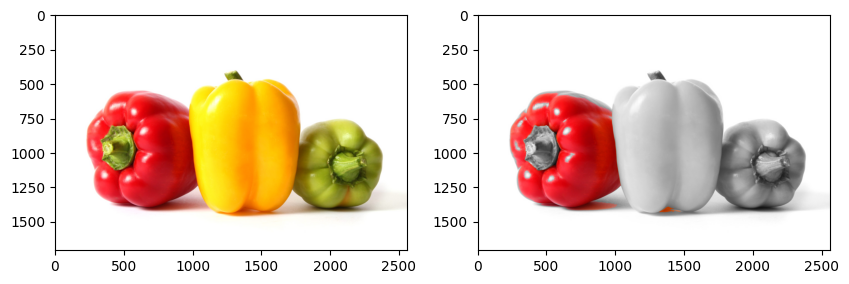

In [24]:
#Tugas 5. Masking Warna Tertentu (Mempertahankan Warna Merah)

import matplotlib.pyplot as plt

img_peppers = cv.imread('/content/drive/MyDrive/PCVK/peppers.jpeg')
img_hsv = cv.cvtColor(img_peppers, cv.COLOR_BGR2HSV)

# Menentukan batas rentang warna merah pada HSV (merah ada di dua ujung hue)
lower_red1 = np.array([0, 120, 70])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 120, 70])
upper_red2 = np.array([180, 255, 255])

# Membuat mask untuk warna merah
mask1 = cv.inRange(img_hsv, lower_red1, upper_red1)
mask2 = cv.inRange(img_hsv, lower_red2, upper_red2)
mask_red = mask1 | mask2

# Membuat versi grayscale dari gambar asli dan mengonversinya kembali ke BGR (3 channel)
gray = cv.cvtColor(img_peppers, cv.COLOR_BGR2GRAY)
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# Menggabungkan gambar: gunakan piksel asli jika mask cocok, sebaliknya gunakan piksel grayscale
result_masked = np.where(mask_red[:, :, None] == 255, img_peppers, gray_bgr)

# Menampilkan dengan Matplotlib
img_rgb = cv.cvtColor(img_peppers, cv.COLOR_BGR2RGB)
res_rgb = cv.cvtColor(result_masked, cv.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_rgb)
axes[1].imshow(res_rgb)
plt.show()

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 0.5


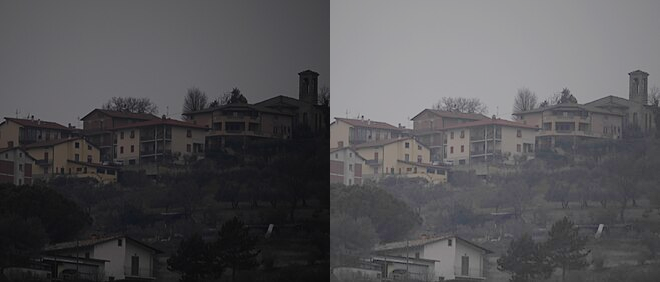

In [29]:
#Tugas 6. Implementasi Gamma Correction

from google.colab.patches import cv2_imshow

print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    # Tetap gunakan float agar bisa menerima nilai desimal seperti 0.5
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

# Sesuaikan path dengan lokasi gambar Anda
img_houses = cv.imread('/content/drive/MyDrive/PCVK/houses.jpg')

# Terapkan formula Gamma Correction tanpa inverse (1/gamma)
# agar input 0.5 langsung bertindak sebagai pangkat yang menerangkan gambar
gamma_corrected = 255 * np.power(img_houses / 255.0, gamma)

# Batasi nilai rentang 0-255 dan kembalikan ke uint8
gamma_corrected = np.clip(gamma_corrected, 0, 255).astype(np.uint8)

# Gabungkan dan tampilkan
final_frame_gamma = cv.hconcat((img_houses, gamma_corrected))
cv2_imshow(final_frame_gamma)

Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


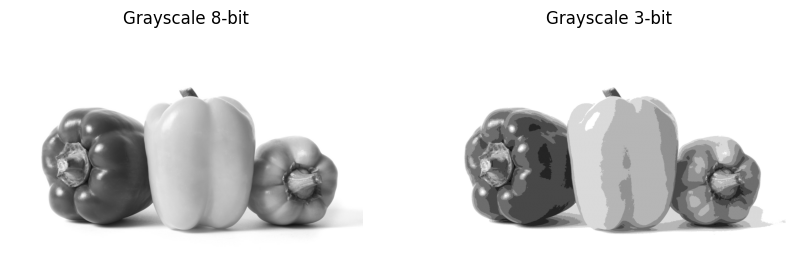

In [30]:
#Tugas 7. Simulasi Image Depth (Kuantisasi Citra)

import matplotlib.pyplot as plt

try:
    bit_depth_tujuan = int(input("Masukkan bit depth tujuan (1-8): "))
except ValueError:
    print("Error, not a number")
    bit_depth_tujuan = 3 # fallback default

# Membaca citra langsung dalam format grayscale
# Sesuaikan path direktori PCVK Anda
original = cv.imread('/content/drive/MyDrive/PCVK/peppers.jpeg', cv.IMREAD_GRAYSCALE)

# Menghitung rentang level berdasarkan kedalaman bit
level = 255.0 / (pow(2, bit_depth_tujuan) - 1)

# Mengaplikasikan kuantisasi citra
depth_image = np.round(original / level) * level
depth_image = depth_image.astype(np.uint8)

print(f"Bit depth awal  : 8 bit")
print(f"Bit depth tujuan: {bit_depth_tujuan} bit")
print(f"Jumlah level    : {pow(2, bit_depth_tujuan)}")

# Menampilkan hasil berdampingan
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(original, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Grayscale 8-bit')
axes[0].axis('off')

axes[1].imshow(depth_image, cmap='gray', vmin=0, vmax=255)
axes[1].set_title(f'Grayscale {bit_depth_tujuan}-bit')
axes[1].axis('off')

plt.show()

In [47]:
#Tugas 8. Modul Average Denoising

import glob
import math

# Fungsi PSNR sesuai formula modul
def PSNR(img1, img2):
    mse = np.mean((img1.astype(float) - img2.astype(float)) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

# Membaca citra asli
img_original = cv.imread('/content/drive/MyDrive/PCVK/galaxy.jpg')

# Membaca 100 citra bernoise
cv_img = []
for img in glob.glob('/content/drive/MyDrive/Kuliah/PCVK/Images/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

# List jumlah rata-rata sesuai tabel di modul
amounts = [10, 20, 40, 80, 100]

print("No | Jumlah Citra di Average | Nilai PSNR (dB)")
print("-" * 50)
for idx, count in enumerate(amounts, start=1):
    # Menggunakan float32 agar tidak overfow saat dijumlahkan
    avg_img = np.zeros_like(img_original, dtype=np.float32)

    # Menjumlahkan citra sebanyak 'count'
    for i in range(count):
        avg_img += cv_img[i]

    # Membagi untuk mendapat rata-rata dan konversi kembali ke uint8
    avg_img /= count
    avg_img = np.round(avg_img).astype(np.uint8)

    # Hitung PSNR
    psnr_val = PSNR(img_original, avg_img)
    print(f"{idx}. | {count:<23} | {psnr_val:.2f}")

# Opsional: Tampilkan hasil denoising terbaik (100 citra)
# cv2_imshow(avg_img)

No | Jumlah Citra di Average | Nilai PSNR (dB)
--------------------------------------------------


IndexError: list index out of range

--- Masking yang digunakan (Untuk Kolom Image Input) ---


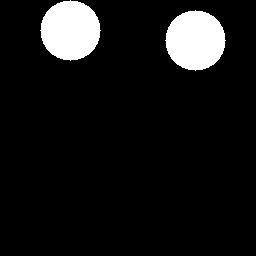


------------------------------------------------------

1. NOT (Komplemen Citra Asli)


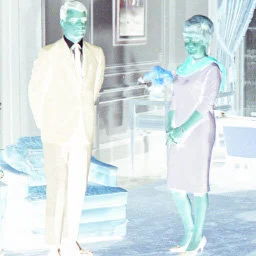


2. OR


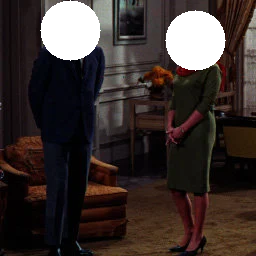


3. AND (Image Masking)


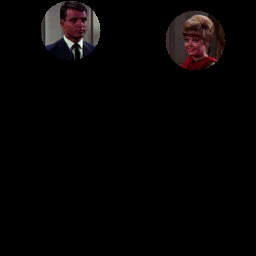


4. NAND


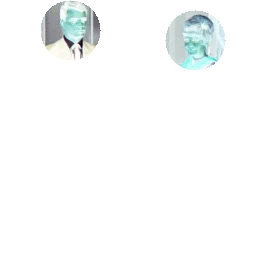


5. XOR


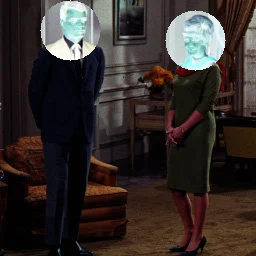

In [43]:
#Tugas 9. Image Masking (Operator Logika)

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_couple = cv.imread('/content/drive/MyDrive/PCVK/couple.jpg')

# Membuat kanvas hitam dengan ukuran yang sama dengan gambar asli
mask = np.zeros_like(img_couple)

# Menggambar dua lingkaran putih (Dinaikkan ke area wajah)
# Format: cv.circle(image, (sumbu_x, sumbu_y), radius, warna, ketebalan)
cv.circle(mask, (70, 30), 30, (255, 255, 255), -1)  # Mask wajah pria (kiri, dinaikkan)
cv.circle(mask, (195, 40), 30, (255, 255, 255), -1) # Mask wajah wanita (kanan, dinaikkan)

print("--- Masking yang digunakan (Untuk Kolom Image Input) ---")
cv2_imshow(mask)
print("\n------------------------------------------------------\n")

print("1. NOT (Komplemen Citra Asli)")
cv2_imshow(cv.bitwise_not(img_couple))

print("\n2. OR")
cv2_imshow(cv.bitwise_or(img_couple, mask))

print("\n3. AND (Image Masking)")
cv2_imshow(cv.bitwise_and(img_couple, mask))

print("\n4. NAND")
cv2_imshow(cv.bitwise_not(cv.bitwise_and(img_couple, mask)))

print("\n5. XOR")
cv2_imshow(cv.bitwise_xor(img_couple, mask))